# Modeling Music

This notebook implements my Modeling Music project which attempts to use a CNN and a VRNN to generate music based upon an inputted track.

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import tensorflow as tf
import pretty_midi
import librosa
import librosa.display
import IPython.display
import time
from platform import python_version
from IPython.display import Audio, display

%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

tf.get_logger().setLevel('INFO')
tf.compat.v1.disable_eager_execution()

# audio sampling rate in hz
audio_sr = 44100

# CHANGE INPUT HERE !!!!!!!!!!!!!!!!!!!!!!!!!!!!!
input_song = 'lemonade.midi'
input_song_name = input_song.split('.')[0]
input_song_path = './audio_files/hiphop/' + input_song

In [2]:
print(f'Numpy version: {np.__version__}')
print(f'matplotlib version: {matplotlib.__version__}')
print(f'tensorflow version: {tf.__version__}')
print(f'pretty_midi version: {pretty_midi.__version__}')
print(f'librosa version: {librosa.__version__}')
print(f'IPython version: {IPython.__version__}')
print(f'Python version: {python_version()}')

Numpy version: 1.23.5
matplotlib version: 3.9.2
tensorflow version: 2.12.0
pretty_midi version: 0.2.10
librosa version: 0.10.2.post1
IPython version: 8.26.0
Python version: 3.11.9


## Load in song data

The below function, `piano_roll_to_pretty_midi` converts a piano roll matrix back to a .midi file. This will be used to convert the decoder's output back into music. It is also used to parse out a section of the Lemonade track by Gucci Mane.

In [3]:
def piano_roll_to_pretty_midi(piano_roll, fs=100, program=0):
    '''Convert a Piano Roll array into a PrettyMidi object with a single instrument.
    
    Parameters
    ----------
    piano_roll : np.ndarray, shape=(128,frames), dtype=int
        Piano roll of one instrument
    fs : int
        Sampling frequency of the columns, i.e. each column is spaced apart by ``1./fs`` seconds.
    program : int
        The program number of the instrument.
    
    Returns
    -------
    midi_object : pretty_midi.PrettyMIDI
        A pretty_midi.PrettyMIDI class instance describing
        the piano roll.
    '''
    notes, frames = piano_roll.shape
    pm = pretty_midi.PrettyMIDI()
    instrument = pretty_midi.Instrument(program=program)

    # pad 1 column of zeros so we can acknowledge inital and ending events
    piano_roll = np.pad(piano_roll, [(0, 0), (1, 1)], 'constant')

    # use changes in velocities to find note on / note off events
    velocity_changes = np.nonzero(np.diff(piano_roll).T)

    # keep track on velocities and note on times
    prev_velocities = np.zeros(notes, dtype=int)
    note_on_time = np.zeros(notes)

    for time, note in zip(*velocity_changes):
        # use time + 1 because of padding above
        velocity = piano_roll[note, time + 1]
        time = time / fs
        if velocity > 0:
            if prev_velocities[note] == 0:
                note_on_time[note] = time
                prev_velocities[note] = velocity
        else:
            pm_note = pretty_midi.Note(
                velocity=prev_velocities[note],
                pitch=note,
                start=note_on_time[note],
                end=time)
            instrument.notes.append(pm_note)
            prev_velocities[note] = 0
    pm.instruments.append(instrument)
    return pm


In [4]:
# extract midi data from specified input .mid file  
pm = pretty_midi.PrettyMIDI(input_song_path)

# get piano roll matrix of the MIDI data
piano_roll = pm.get_piano_roll()

# GUCCI MANE SPECIFIC PARSING INFO
piano_rolls = np.split(piano_roll, [2300, 9750], 1)
piano_roll_prepped = piano_rolls[1]
pm = piano_roll_to_pretty_midi(piano_roll_prepped)

piano_roll = (piano_roll_prepped.T > 0).astype(np.float32)

## EDA

There are 1 instrument(s) in the prettymidi'd song:
	Instrument 1 name & class: Acoustic Grand Piano, Piano
	Instrument 1 has: 7184 notes
	Instrument 1 has: 0 pitch bends
	Instrument 1 has: 0 control changes

---------------
Estimated song tempo: 230
Number of time signature changes: 0
---------------


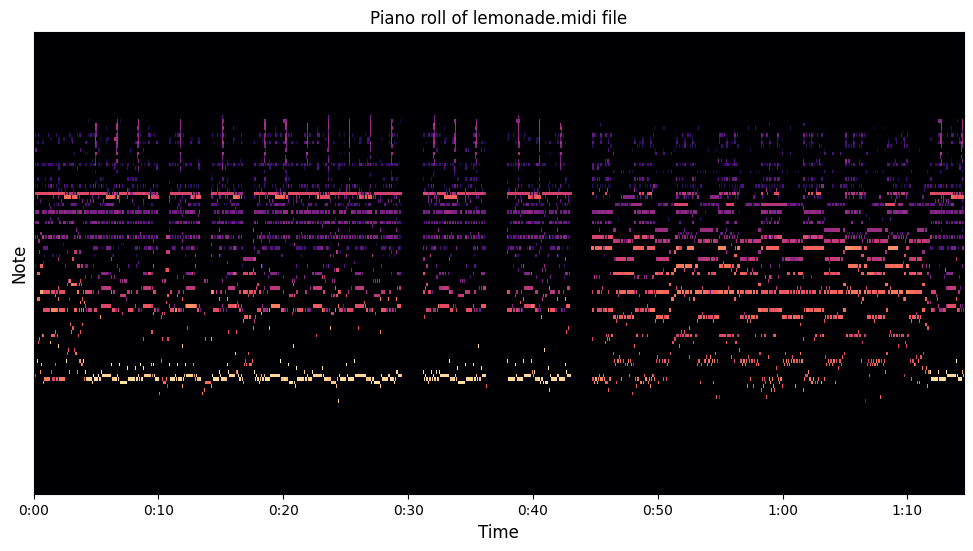

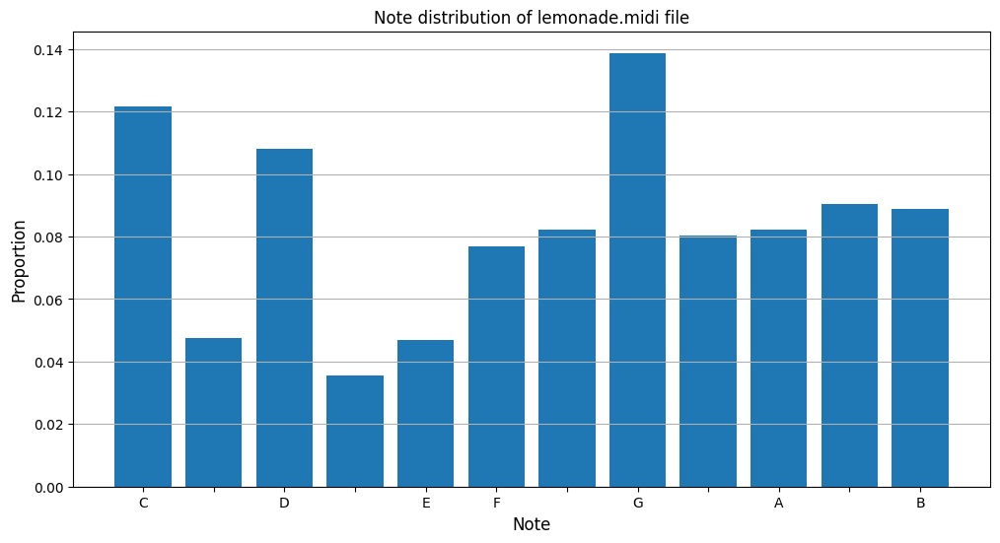

Press play to hear: lemonade.midi


In [5]:
# Get beats per measure
def get_beats_per_measure(pm):
    try:
        ts = pm.time_signature_changes
        ts = ts.__repr__()[:]
        for char in ts:
            if char.isnumeric():
                return int(char)
        return 4
    except:
        return 4

def print_track_info(pm):
    ts = pm.time_signature_changes
    estimated_tempo = pm.estimate_tempo()
    
    print(f'Estimated song tempo: {estimated_tempo:.0f}')
    print(f'Number of time signature changes: {len(ts)}')
    for i in range(len(ts)):
        print(f'\tTime Signature {i+1}: {ts[i]}')
    print('---------------')
    
def print_instrument_info(pm):
    instruments = pm.instruments
    print(f'There are {len(instruments)} instrument(s) in the prettymidi\'d song:')
    for idx, instrument in enumerate(instruments):
        instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
        instrument_class = pretty_midi.program_to_instrument_class(instrument.program)
        amount_notes = len(pm.instruments[idx].notes)
        pitch_bends = len(pm.instruments[idx].pitch_bends)
        control_changes = len(pm.instruments[idx].control_changes)
        print(f'\tInstrument {idx+1} name & class: {instrument_name}, {instrument_class}')
        print(f'\tInstrument {idx+1} has: {amount_notes} notes')
        print(f'\tInstrument {idx+1} has: {pitch_bends} pitch bends')
        print(f'\tInstrument {idx+1} has: {control_changes} control changes\n')
    print('---------------')
    
    
def plot_piano_roll(piano_roll, start_pitch=0, end_pitch=127, fs=100):
    plt.figure(figsize=(12, 6))
    # Use librosa's specshow function for displaying the piano roll
    plt.title(f'Piano roll of {input_song} file', fontsize=12)
    plt.xlabel('Time', fontsize=12)
    plt.ylabel('Note', fontsize=12)
    librosa.display.specshow(piano_roll[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))
    plt.show()

def plot_note_distribution(pm):
    plt.figure(figsize=(12, 6))
    plt.bar(np.arange(12), pm.get_pitch_class_histogram());
    plt.xticks(np.arange(12), ['C', '', 'D', '', 'E', 'F', '', 'G', '', 'A', '', 'B'])
    plt.title(f'Note distribution of {input_song} file', fontsize=12)
    plt.xlabel('Note', fontsize=12)
    plt.ylabel('Proportion', fontsize=12)
    plt.grid(axis='y')
    plt.show()

# Report track information
print_instrument_info(pm)
print_track_info(pm)

#Print piano roll of track
# plot_piano_roll(pm, 0, 127)
plot_piano_roll(piano_roll_prepped)
plot_note_distribution(pm)

#show option to play track 
print(f'Press play to hear: {input_song}')
IPython.display.Audio(pm.synthesize(fs=audio_sr), rate=audio_sr)

## Parameter Initialization
Change the values in the following two cells to affect different components of the CNN-VRNN model.

In [6]:
''' Data formatting/parsing parameters '''
# Get beats per measure
beats_per_measure = get_beats_per_measure(pm)
print(f'Beats per measure: {beats_per_measure}')
print('---------------')

# Set measures per phrase & beats per phrase
measures_per_phrase = 8
beats_per_phrase = beats_per_measure * measures_per_phrase
print(f'Beats per phrase: {beats_per_phrase}')
print('---------------')

Beats per measure: 4
---------------
Beats per phrase: 32
---------------


In [7]:
# Notes have a pitch number ranging from 0 to 127, representing all possible notes from C-1 to G9
# Thus, the width of images inputted to NN should be equal to note_range to account for all notes that can possibly be generated
note_range = 128
img_input_width = note_range
width = img_input_width

# set equal to one phrase's worth of beats
img_input_height = beats_per_phrase
height = img_input_height
print(f'IMG dimensions: {height} x {width}')
print('---------------')
''''''


'''NN Params'''
# use as initializer
initializer = tf.initializers.GlorotUniform()

# dropout rate for drop layers
dropout_rate = 0.0
''''''

'''CNN Params'''
number_conv_layers = 2

# kernel for first conv layer
init_kernel_shape = [3,3,1,32]

# kernel for subsequent layers
sub_kernel_shape = [3,3,32,32]

# shape of max pooling window
max_pool_shape = [1,2,2,1]
''''''


'''Encoder Params'''
#default size of gru cell
gru_size = 512

# dimension of encoder output
z_dim = int(gru_size / number_conv_layers)
''''''


'''Decoder Params'''
# dimensions of decoder output
X_dim = width * height
''''''


''' Training / Testing Parameters'''
# amount of observations per batch which equals one phrase's worth of beats
batch_size = 16

# number of batches per epoch
num_batches = int(len(piano_roll) / (batch_size*img_input_height))
print(f'Number of batches: {num_batches}')

# number of epochs
num_epochs = 100

# threshold for predictions
pred_threshold = 0.97

# testing batch amount (derives how much testing is performed)
test_batch_amount = 5

# determine how long to run testing
test_length = test_batch_amount * batch_size

''''''


'''Input / Output'''
checkpoint_file = f'./tfmodel/{input_song_name}_{num_epochs}_epochs_NewKLA.tfmodel' 

output_song_path = f'./output/test_{input_song}'
''''''

IMG dimensions: 32 x 128
---------------
Number of batches: 14


''

## Accessory Functions

The below block contains two functions, `conv_pool_relu` & `midi_latent_feature`. The `midi_latent_feature` function creates and returns a CNN, that has a parameterized (number_conv_layers) amount of layers, by calling the `conv_pool_relu function`. The `conv_pool_relu` function creates a CNN that is composed of a convolutional layer, max_pooling layer followed by a ReLU activation layer.

In [8]:
# return a CNN comprised of a convolutional layer connected to a relu layer connected to a max pooling layer
def conv_pool_relu(inputs, kernel_shape, pool_shape, name="conv2d", reuse=False, dtype=tf.float32):
    
    with tf.compat.v1.variable_scope(name) as scope:
        
        # create kernel for convolutional neural layer
        conv_kernel = tf.compat.v1.get_variable('conv2d', shape=kernel_shape, initializer=initializer, dtype=dtype)
        
        # create bias for convoluational neural layer
        conv_bias = tf.compat.v1.get_variable('conv2d_b', shape=kernel_shape[3], dtype=dtype)
        
        # create convolutional layer based on kernel
        conv_layer = tf.nn.conv2d(inputs, conv_kernel, [1,1,1,1], "SAME")
        
        # add a bias to the convolutional layer 
        bias_layer = tf.nn.bias_add(conv_layer, conv_bias)
        
        
        # add max pooling layer to down-sample an input representation to reduce its dimensionality and \
        # allow for assumptions to be made about features contained in the sub-regions binned.
        pool_layer = tf.nn.max_pool(bias_layer, pool_shape, pool_shape, "SAME")
        
        # add relu layer to neural network -> just changes all the negative activations to 0.This layer 
        # increases the nonlinear properties of the model and the overall network without affecting the receptive 
        # fields of the conv layer.
        relu_layer = tf.nn.relu(pool_layer)
    
        return relu_layer


# generate a latent_feature space of the midi data by using two cnns connected to each other
def midi_latent_feature(X, init_kernel_shape, sub_kernel_shape, max_pool_shape, dropout_rate=dropout_rate, name='latent_feature', reuse=False):
    with tf.compat.v1.variable_scope(name, reuse=reuse) as scope:
        
        for i in range(number_conv_layers):
            if i == 0:
                # create the first cnn
                conv_out = conv_pool_relu(X, 
                                           kernel_shape=init_kernel_shape, #[filter_height, filter_width, in_channels, out_channels] [2,2, 1, 32]
                                           pool_shape=max_pool_shape, # most common filter size is 2x2 for pooling
                                           name=f"conv_{i+1}"
                                          )
            
            else:
                # create the second cnn
                conv_out = conv_pool_relu(conv_out, 
                                           kernel_shape=sub_kernel_shape,  #[filter_height, filter_width, in_channels, out_channels] used to be [2,2, 32, 32]
                                           pool_shape=max_pool_shape, # most common filter size is 2x2 for pooling
                                           name=f"conv_{i+1}"
                                          )

        # flatten the output of the convlutional layer
        h = tf.compat.v1.layers.flatten(conv_out)

        return tf.nn.dropout(h, rate=dropout_rate)
        

The below cell contains the `gru` function. This function creates a recurrent neural network based upon a GRU cell. This RNN is utilized by the model's encoder and decoder. 

In [9]:
# gated recurrent unit 
def gru(inputs, gru_size=gru_size, initial_state=None, name="GRU", reuse=False, dtype=tf.float32):
    with tf.compat.v1.variable_scope(name, reuse=reuse) as scope:
        
        # Construct GRU cell
        gru_cell = tf.compat.v1.nn.rnn_cell.GRUCell(gru_size, reuse=reuse)
        
        # get input shape
        input_shape = tf.shape(inputs)

        # set init state if not already set
        if initial_state is None:
            initial_state = gru_cell.zero_state(batch_size=input_shape[0], dtype=dtype)

        # build rnn based upon GRU cell
        outputs,state = tf.compat.v1.nn.dynamic_rnn(gru_cell, inputs, 
                            initial_state=initial_state, dtype=dtype)
        
        return outputs, state
    

The below cell implements the `sample_z`, `Encoder` and `Decoder` functions. The `Encoder` function creates an encoder which processes the latent feature space of the CNN and returns two codings, z_mu and z_logvar. The CNN-VRNN then takes a sample of these two codings using the `sample_z` function. From here, we input the random sample into the `Decoder` function, which creates a decoder to translate the random sample input back into a piano roll matrix.

In [10]:
# take sample 
def sample_z(mu, log_var):
    with tf.name_scope("Random_samples"):
        eps = tf.random.normal(shape=tf.shape(mu))
        return mu + tf.exp(log_var * 0.5) * eps

    
def Encoder(X, name_scope="Encoder"):
    with tf.name_scope(name_scope):
        with tf.name_scope("Encoder_RNN"):
            
            #Add an outer batch axis to input so that it may be processed by RNN
            rnn_in = tf.expand_dims(X, 0)
            
            # get outputs of all cells and state of last cell
            rnn_outs, rnn_state = gru(rnn_in, gru_size=z_dim, name="gru_enc")
            
            #Reshape rnn state for later operations
            rnn_state = tf.reshape(rnn_state[-1,:], [1, z_dim])
        
        
        with tf.name_scope("Calculate_mu_sigma"):
            # get weights and bias for encoder's mean encodings
            encoder_weights_mean = tf.compat.v1.get_variable('encoder_mean_weights', shape=[z_dim, z_dim], initializer=initializer)
            encoder_bias_mean = tf.compat.v1.get_variable('encoder_mean_bias', shape=[z_dim], initializer=initializer)

            # get weights and bias for encoder's standard deviation encodings
            encoder_weights_sigma = tf.compat.v1.get_variable('encoder_variance_weights', shape=[z_dim, z_dim], initializer=initializer)
            encoder_bias_sigma = tf.compat.v1.get_variable('encoder_variance_bias', shape=[z_dim], initializer=initializer)
            
            #KL divergence with last GRU state
            z_mu = tf.matmul(rnn_state, encoder_weights_mean) + encoder_bias_mean
            z_logvar = tf.matmul(rnn_state, encoder_weights_sigma) + encoder_bias_sigma
            
        return z_mu, z_logvar



def Decoder(z,  xt=None, dropout_rate=dropout_rate, name_scope="Decoder", reuse=False):
    with tf.name_scope(name_scope):
        
        
        with tf.name_scope("concatenate_noise_and_input"):
            if xt is not None:
                
                #Add noise to input z
                decoder_input_weights = tf.compat.v1.get_variable('decoder_input_weights', shape=[xt.get_shape().as_list()[1], z_dim], initializer=initializer)
                decoder_input_bias = tf.compat.v1.get_variable('decoder_input_bias', shape=[z_dim], initializer=initializer)
                xt_in = tf.matmul(xt, decoder_input_weights) + decoder_input_bias
                z = tf.concat([z, xt_in], axis=0)
                
            # Reshape rnn state for later operations
            z = tf.expand_dims(z, 0)

            
        with tf.name_scope("Decoder_RNN"):
            
            # get outputs of all cells and state of last cell and reshape outputs
            dec_outs, _ = gru(z, gru_size=gru_size, name="gru_dec", reuse=reuse)
            dec_outs = tf.reshape(dec_outs, [-1, gru_size])
            drop = tf.nn.dropout(dec_outs, rate=dropout_rate)
            
            
            decoder_weights = tf.compat.v1.get_variable('decoder_output_weights', shape=[gru_size, X_dim], initializer=initializer)
            decoder_bias = tf.compat.v1.get_variable('decoder_output_bias', shape=[X_dim], initializer=initializer)

        logits = tf.matmul(drop, decoder_weights) + decoder_bias
        prob = tf.nn.sigmoid(logits)
        return prob, logits

## Setting up the CNN-VRNN model

The below cell sets up the CNN-VRNN model to be trained and tested upon.

In [11]:
'''For training'''
# store inputted training sample
X = tf.compat.v1.placeholder(tf.float32, shape=[None, height, width, 1], name="Training_samples")

'''For testing'''
# store inputted testing values
z = tf.compat.v1.placeholder(tf.float32, shape=[None, z_dim], name="Generated_noise")
z_rnn_samples = tf.compat.v1.placeholder(tf.float32, shape=[None, height, width, 1], name="Generated_midi_input")


with tf.compat.v1.variable_scope('vae_rnn') as scope:
    
    '''For training'''
    # generate a latent_feature_space of the midi data using a CNN
    latent_features = midi_latent_feature(X,
                                          init_kernel_shape=init_kernel_shape,
                                          sub_kernel_shape=sub_kernel_shape,
                                          max_pool_shape=max_pool_shape,
                                          dropout_rate=dropout_rate,
                                          name='CNN_Encoder')

    # get mean & std. dev encodings from encoder & take sample
    z_mu, z_logvar = Encoder(latent_features,
                             name_scope="Encoder_train")
    z_sample = sample_z(z_mu, z_logvar)

    # decode sample
    out_samples, logits = Decoder(z_sample, name_scope="Decoder_train", xt=latent_features[:-1])
    ''''''
    
    '''For testing'''
    # Sampling from random z
    scope.reuse_variables()
    latent_z_rnn = midi_latent_feature(z_rnn_samples, 
                                       init_kernel_shape=init_kernel_shape,
                                       sub_kernel_shape=sub_kernel_shape,
                                       max_pool_shape=max_pool_shape,
                                       dropout_rate=dropout_rate,
                                       name='CNN_Encoder', reuse=True)
    X_samples, _ = Decoder(z, name_scope="Decoder_test", xt=latent_z_rnn, reuse=True)
    ''''''
    
# calculate loss
with tf.name_scope("Loss"):
    with tf.name_scope("cross_entropy"):
        X_labels = tf.reshape(X, [-1, width*height])
        recon_loss = tf.reduce_sum(tf.nn.sigmoid_cross_entropy_with_logits(logits=logits, labels=X_labels), 1)
        
    with tf.name_scope("kl_divergence"):
#         kl_loss = (-0.5 * (1 + z_logvar - tf.square(z_mu) - tf.exp(z_logvar))) 
        kl_loss = 0.5 * tf.reduce_sum(tf.square(z_mu) + tf.square(z_logvar) - tf.math.log(tf.square(z_logvar)) - 1,1) 
    
    loss = tf.reduce_mean(recon_loss + kl_loss)

# optimize weights 
with tf.name_scope("Optimizer"):
    solver =tf.compat.v1.train.AdamOptimizer()
    grads = solver.compute_gradients(loss)
    grads = [(tf.clip_by_norm(g, clip_norm=10), v) for g, v in grads] # use gradient clipping to prevent gradients from vanishing or exploding
    train_op = solver.apply_gradients(grads)

Instructions for updating:
Please use `keras.layers.RNN(cell)`, which is equivalent to this API
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


## Training

In [12]:
# create a saver object to our model after it has finished training
saver =  tf.compat.v1.train.Saver()

In [13]:
with tf.compat.v1.Session() as sess:
    sess.run(tf.compat.v1.global_variables_initializer())
    epoch_counter=0

    start = time.time()
    for epoch_count in range(num_epochs+1):
        for batch_num in range(num_batches):
            
            # get data from piano roll and shape it to be (# of batches, height of batch, width of batch, 1 (because everything is in the same channel))
            # everything is in the same channel because color doesn't really matter to us for this experiment
            start_index = batch_num*batch_size*img_input_height
            stop_index = (batch_num+1)*batch_size*img_input_height
            s = piano_roll[start_index: stop_index, :note_range].reshape(batch_size, height, width, 1)

            # train the VAE
            _,loss_out, kl, recon = sess.run([train_op, loss, kl_loss, recon_loss], feed_dict={X: s})
            
            if epoch_count != 0 and batch_num == 0:
                print(f'Epoch Count: {epoch_count}')
                print('Loss: ', loss_out, 'KL Loss:', kl, 'Recon Loss', recon)
                end = time.time()
                print(f'TIME: {end - start}')
                print('-----------------')
            
    saver.save(sess, checkpoint_file)

Epoch Count: 1
Loss:  843.5132 KL Loss: [60.756706] Recon Loss [1663.6172   758.6888   624.9094   539.4573   702.1892   642.12384
  762.6731   608.6139   730.21313  820.88574  835.3073   860.58704
  700.2332   640.2398   642.8416   991.5227 ]
TIME: 4.400516748428345
-----------------
Epoch Count: 2
Loss:  710.8036 KL Loss: [30.411974] Recon Loss [909.5038  756.17377 571.5271  448.20703 608.01166 583.40155 642.6694
 520.7362  718.69763 804.5084  840.871   791.5145  728.42914 548.1614
 573.51965 840.333  ]
TIME: 7.981144428253174
-----------------
Epoch Count: 3
Loss:  676.3081 KL Loss: [17.041426] Recon Loss [797.4325  731.7498  577.98535 471.9675  622.6648  589.98413 649.1992
 521.0024  671.8652  760.9729  768.6077  766.5777  679.3445  568.4377
 569.1592  801.3163 ]
TIME: 11.492331981658936
-----------------
Epoch Count: 4
Loss:  658.1477 KL Loss: [15.852734] Recon Loss [617.9789  722.21027 568.69653 457.97388 608.8164  585.3893  639.311
 520.2992  667.88574 751.96405 776.203   770.238

## Testing

INFO:tensorflow:Restoring parameters from ./tfmodel/lemonade_100_epochs_NewKLA.tfmodel


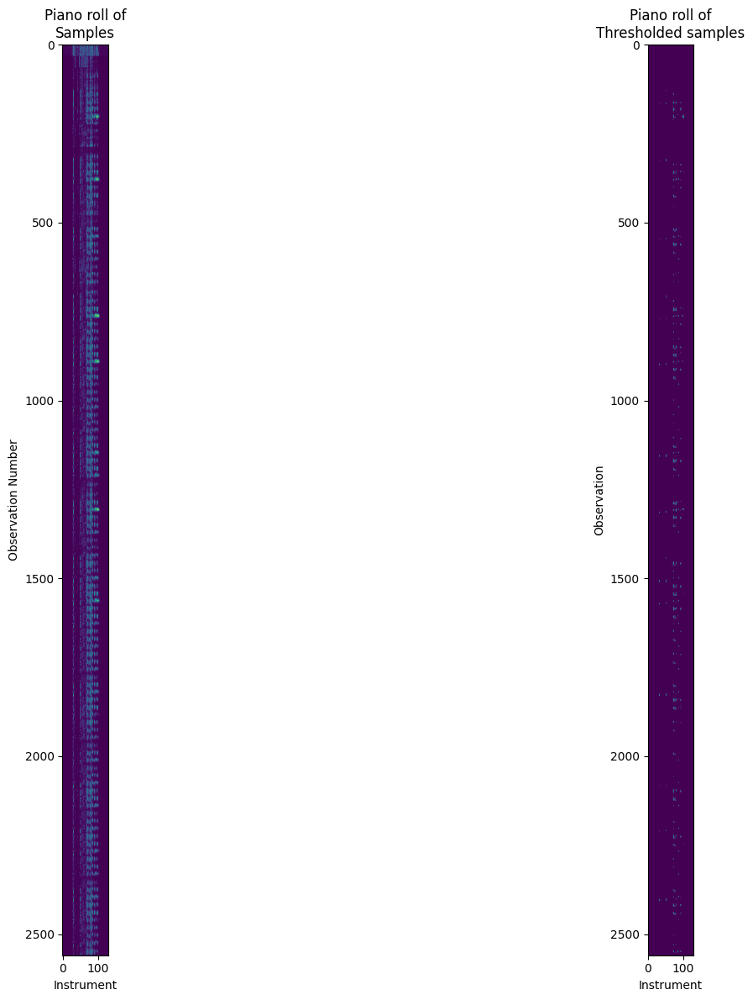

In [18]:
with tf.compat.v1.Session() as sess:
    
    # load in trained model
    saver.restore(sess, checkpoint_file)
   
    #samples for testing
    z_in = np.random.randn(1, z_dim)
    z_rnn_out = np.zeros((1,height,width,1))
    

    # test our model based upon above sample
    for idx in range(test_length):
        samples = sess.run(X_samples, feed_dict={z: np.random.randn(1, z_dim), z_rnn_samples: z_rnn_out})
        
        obs_amount = idx + 1
        if idx == 0:
            obs_amount = 2
        
        z_rnn_out = samples.reshape((obs_amount, height, width, 1))
        
        if idx == 0:
            z_rnn_out = np.expand_dims(z_rnn_out[-1,:,:,:], axis=0)
        
    # reshape samples back into piano_roll
    samples = samples.reshape((img_input_height*test_length, note_range))
    thresh_S = (samples >= pred_threshold).astype(np.float32) * 127

    plt.figure(figsize=(20, 12))
    
    plt.subplot(1,2,1)
    plt.ylabel('Observation Number')
    plt.xlabel("Instrument")
    plt.title("Piano roll of\nSamples")
    plt.imshow(samples)
    
    plt.subplot(1,2,2)
    plt.ylabel('Observation')
    plt.xlabel("Instrument")
    plt.title("Piano roll of\nThresholded samples")
    plt.imshow(thresh_S)

    plt.tight_layout()
    
    # convert generated output into .midi file and save
    pm = piano_roll_to_pretty_midi(thresh_S.T)
    pm.write(output_song_path)

# listen to test output
IPython.display.Audio(pm.synthesize(fs=audio_sr), rate=audio_sr)